# Import

In [56]:
import numpy as np
import pandas as pd
import os

from scipy.stats import chi2_contingency
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport



from sqlalchemy import create_engine, text

engine = create_engine('sqlite://', echo = False)

In [57]:
customers = pd.read_csv('input/olist_customers_dataset.csv')
geolocation = pd.read_csv('input/olist_geolocation_dataset.csv')
order_items = pd.read_csv('input/olist_order_items_dataset.csv')
order_payments = pd.read_csv('input/olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('input/olist_order_reviews_dataset.csv')
orders = pd.read_csv('input/olist_orders_dataset.csv')
products = pd.read_csv('input/olist_products_dataset.csv')
sellers = pd.read_csv('input/olist_sellers_dataset.csv')
category_name = pd.read_csv('input/product_category_name_translation.csv')


# Cleaning

In [58]:
def display_data_stats(df, table_name):
    print(f"\n### {table_name} ###")

    print("\nMissing Data:")
    print(df.isnull().sum())

    print("\nNumber of Duplicates:")
    print(df.duplicated().sum())

    numeric_columns = df.select_dtypes(include=['number', 'datetime']).columns
    non_numeric_columns = df.select_dtypes(exclude=['number', 'datetime']).columns

    if not numeric_columns.empty:
        print("\nBasic Statistics for Numeric Columns:")
        print(df[numeric_columns].describe())

    if not non_numeric_columns.empty:
        print("\nSummary for Non-Numeric Columns:")
        print(df[non_numeric_columns].describe(include='all'))

    print("-" * 50)




## Order Items

In [59]:
display_data_stats(order_items, "Order Items")
def clean_order_items(df):
    # Handle missing values
    df.fillna({'price': df['price'].median(), 'order_id': 'unknown'}, inplace=True)

    # Handle duplicates
    df.drop_duplicates(inplace=True)


    return df
cleaned_order_items = clean_order_items(order_items)
profile = ProfileReport(cleaned_order_items, title="Pandas Profiling Report")
profile.to_notebook_iframe()


### Order Items ###

Missing Data:
order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

Number of Duplicates:
0

Basic Statistics for Numeric Columns:
       order_item_id          price  freight_value
count  112650.000000  112650.000000  112650.000000
mean        1.197834     120.653739      19.990320
std         0.705124     183.633928      15.806405
min         1.000000       0.850000       0.000000
25%         1.000000      39.900000      13.080000
50%         1.000000      74.990000      16.260000
75%         1.000000     134.900000      21.150000
max        21.000000    6735.000000     409.680000

Summary for Non-Numeric Columns:
                                order_id                        product_id  \
count                             112650                            112650   
unique                             98666                       

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Customers

In [60]:
display_data_stats(customers, "Customers")
def clean_customers(df):
    # Handle missing values
    df.fillna({'customer_unique_id': 'unknown', 'customer_zip_code_prefix': df['customer_zip_code_prefix'].median()}, inplace=True)

    # Handle duplicates
    df.drop_duplicates(subset=['customer_unique_id'], inplace=True)

    return df
cleaned_customers = clean_customers(customers)
profile = ProfileReport(cleaned_customers, title="Pandas Profiling Report")
profile.to_notebook_iframe()


### Customers ###

Missing Data:
customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

Number of Duplicates:
0

Basic Statistics for Numeric Columns:
       customer_zip_code_prefix
count              99441.000000
mean               35137.474583
std                29797.938996
min                 1003.000000
25%                11347.000000
50%                24416.000000
75%                58900.000000
max                99990.000000

Summary for Non-Numeric Columns:
                             customer_id                customer_unique_id  \
count                              99441                             99441   
unique                             99441                             96096   
top     06b8999e2fba1a1fbc88172c00ba8bc7  8d50f5eadf50201ccdcedfb9e2ac8455   
freq                                   1                                17   

       customer_city custo

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Order Reviews

In [61]:
display_data_stats(order_reviews, "Order Reviews")
def clean_order_reviews(df):
    # Handle missing values
    df.fillna({'review_score': df['review_score'].median()}, inplace=True)

    # Handle duplicates
    df.drop_duplicates(inplace=True)

    return df
cleaned_order_reviews = clean_order_reviews(order_reviews)
profile = ProfileReport(cleaned_order_reviews, title="Pandas Profiling Report")
profile.to_notebook_iframe()


### Order Reviews ###

Missing Data:
review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

Number of Duplicates:
0

Basic Statistics for Numeric Columns:
       review_score
count  99224.000000
mean       4.086421
std        1.347579
min        1.000000
25%        4.000000
50%        5.000000
75%        5.000000
max        5.000000

Summary for Non-Numeric Columns:
                               review_id                          order_id  \
count                              99224                             99224   
unique                             98410                             98673   
top     7b606b0d57b078384f0b58eac1d41d78  c88b1d1b157a9999ce368f218a407141   
freq                                   3                                 3   

       review_comment_title review_comment_messag

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Orders

In [62]:
display_data_stats(orders, "Orders")
def clean_orders(df):
    # Handle missing values
    df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], errors='coerce')
    df['order_approved_at'] = pd.to_datetime(df['order_approved_at'], errors='coerce')
    df.fillna({'order_approved_at': df['order_purchase_timestamp']}, inplace=True)

    # Handle duplicates
    df.drop_duplicates(subset=['order_id'], inplace=True)

    return df
cleaned_orders = clean_orders(orders)
profile = ProfileReport(cleaned_orders, title="Pandas Profiling Report")
profile.to_notebook_iframe()


### Orders ###

Missing Data:
order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

Number of Duplicates:
0

Summary for Non-Numeric Columns:
                                order_id                       customer_id  \
count                              99441                             99441   
unique                             99441                             99441   
top     e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
freq                                   1                                 1   

       order_status order_purchase_timestamp    order_approved_at  \
count         99441                    99441                99281   
unique            8                    98875                9073

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [63]:
output_dir = '/clean/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

cleaned_order_items.to_csv(f'{output_dir}/order_items.csv', index=False)
cleaned_customers.to_csv(f'{output_dir}/customers.csv', index=False)
cleaned_order_reviews.to_csv(f'{output_dir}/order_reviews.csv', index=False)
cleaned_orders.to_csv(f'{output_dir}/orders.csv', index=False)
profile = ProfileReport(cleaned_order_items, title="Pandas Profiling Report")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Convert to SQL

In [64]:
cleaned_customers.to_sql('customers', con=engine)
cleaned_order_items.to_sql('order_items', con=engine)
cleaned_order_reviews.to_sql('order_reviews', con=engine)
cleaned_orders.to_sql('orders', con=engine)

99441

### Create RFM table

In [65]:
query0 = text('''
DROP TABLE IF EXISTS RFM_Extended
''')

query1 = text('''
CREATE TABLE IF NOT EXISTS RFM_Extended AS
        SELECT
            customer_unique_id,
            AVG(oi.price) AS Monetary,
            COUNT(o.order_id) AS Frequency,
            JULIANDAY((SELECT MAX(order_purchase_timestamp) FROM orders)) - JULIANDAY(MAX(o.order_purchase_timestamp)) AS Recency,
            AVG(COALESCE(orv.review_score, 0)) AS AVG_review,
            AVG(JULIANDAY(o.order_delivered_customer_date) - JULIANDAY(o.order_purchase_timestamp)) AS AVG_delivery_time,
            MAX(o.order_purchase_timestamp) AS Last_Order_Date
        FROM
        orders o
        LEFT JOIN
        order_items oi ON o.order_id = oi.order_id
        LEFT JOIN
        customers c ON o.customer_id = c.customer_id
        LEFT JOIN order_reviews orv ON o.order_id = orv.order_id
        GROUP BY c.customer_unique_id;
''')



query2 = '''
SELECT * FROM RFM_Extended
'''
with engine.connect() as connection:
    connection.execute(query0)
    connection.execute(query1)
pd.read_sql_query(query2, con=engine)

,customer_unique_id,Monetary,Frequency,Recency,AVG_review,AVG_delivery_time,Last_Order_Date
0,None,102.449567,4402,0.884907,4.014312,12.086368,2018-10-16 20:16:02.000000
1,0000366f3b9a7992bf8c76cfdf3221e2,129.900000,1,160.273507,5.000000,6.411227,2018-05-10 10:56:27.000000
2,0000b849f77a49e4a4ce2b2a4ca5be3f,18.900000,1,163.263090,4.000000,3.285590,2018-05-07 11:11:27.000000
3,0000f46a3911fa3c0805444483337064,69.000000,1,585.850868,3.000000,25.731759,2017-03-10 21:05:03.000000
4,0000f6ccb0745a6a4b88665a16c9f078,25.990000,1,369.875428,4.000000,20.037083,2017-10-12 20:29:41.000000
...,...,...,...,...,...,...,...
96092,fffcf5a5ff07b0908bd4e2dbc735a684,785.000000,2,495.853958,5.000000,27.514861,2017-06-08 21:00:36.000000
96093,fffea47cd6d3cc0a88bd621562a9d061,64.890000,1,310.890532,4.000000,30.097500,2017-12-10 20:07:56.000000
96094,ffff371b4d645b6ecea244b27531430a,89.900000,1,617.070162,5.000000,14.872083,2017-02-07 15:49:16.000000
96095,ffff5962728ec6157033ef9805bacc48,115.000000,1,168.092095,5.000000,11.858854,2018-05-02 15:17:41.000000


In [66]:
df_rfm_extended = pd.read_sql('SELECT * FROM RFM_Extended', engine)

### Cleaning RFM Table

In [77]:
df_rfm_extended['is_monetary_missing'] = df_rfm_extended['Monetary'].isna().astype(int)
monetary_median = df_rfm_extended['Monetary'].median()
df_rfm_extended.loc[:, 'Monetary'] = df_rfm_extended['Monetary'].fillna(monetary_median)
df_rfm_extended.loc[:, 'AVG_delivery_time'] = df_rfm_extended['AVG_delivery_time'].fillna(-1)
df_rfm_extended = df_rfm_extended[df_rfm_extended['customer_unique_id'] != 'None']
df_rfm_extended = df_rfm_extended[df_rfm_extended['customer_unique_id'] != 0]
df_rfm_extended = df_rfm_extended[df_rfm_extended['customer_unique_id'].notnull()]

# Analysis

In [68]:
scaler = StandardScaler()
variables = ['Monetary', 'Frequency', 'Recency', 'AVG_review', 'AVG_delivery_time']

df_rfm_extended_scaled = scaler.fit_transform(df_rfm_extended[variables])
df_rfm_extended_scaled = pd.DataFrame(df_rfm_extended_scaled, columns=variables)

## Histogram

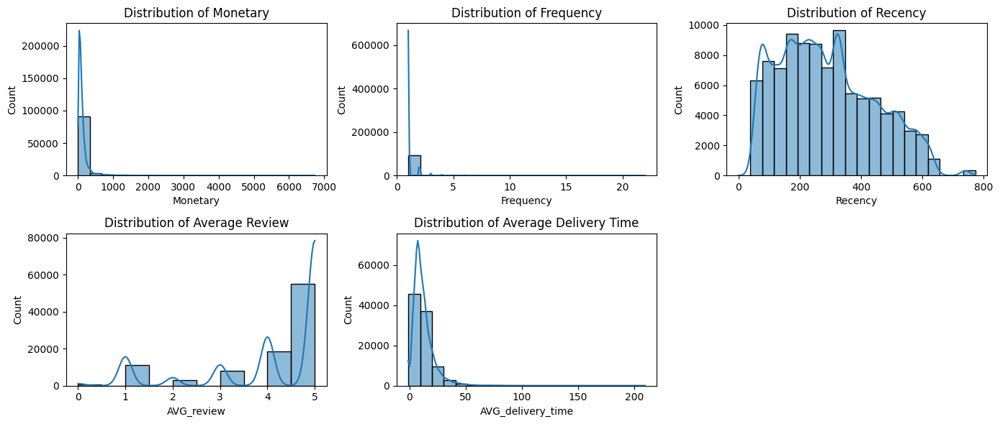

In [69]:
plt.figure(figsize=(14, 6))

plt.subplot(2, 3, 1)
sns.histplot(df_rfm_extended['Monetary'], bins=20, kde=True)
plt.title('Distribution of Monetary')

plt.subplot(2, 3, 2)
sns.histplot(df_rfm_extended['Frequency'], bins=20, kde=True)
plt.title('Distribution of Frequency')

plt.subplot(2, 3, 3)
sns.histplot(df_rfm_extended['Recency'], bins=20, kde=True)
plt.title('Distribution of Recency')

plt.subplot(2, 3, 4)
sns.histplot(df_rfm_extended['AVG_review'], bins=10, kde=True)
plt.title('Distribution of Average Review')

plt.subplot(2, 3, 5)
sns.histplot(df_rfm_extended['AVG_delivery_time'], bins=20, kde=True)
plt.title('Distribution of Average Delivery Time')

plt.tight_layout()
plt.show()


## Boxplot

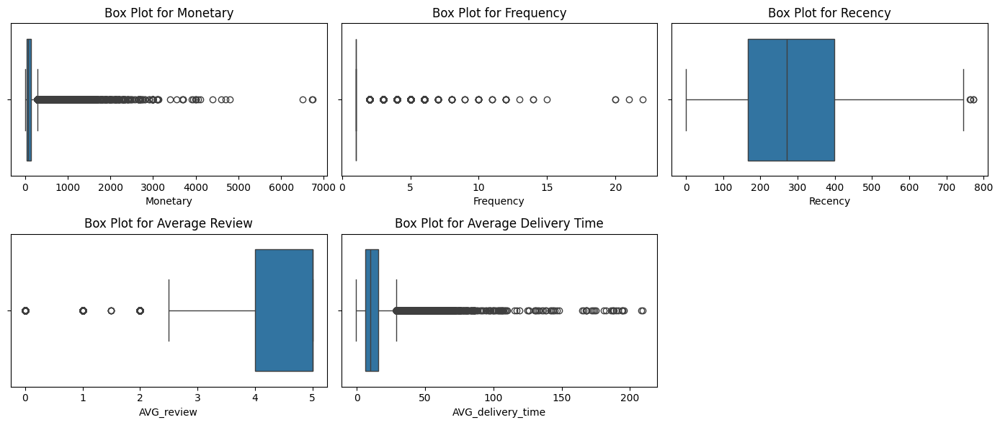

In [70]:
plt.figure(figsize=(14, 6))

plt.subplot(2, 3, 1)
sns.boxplot(data=df_rfm_extended, x='Monetary')
plt.title('Box Plot for Monetary')

plt.subplot(2, 3, 2)
sns.boxplot(data=df_rfm_extended, x='Frequency')
plt.title('Box Plot for Frequency')

plt.subplot(2, 3, 3)
sns.boxplot(data=df_rfm_extended, x='Recency')
plt.title('Box Plot for Recency')

plt.subplot(2, 3, 4)
sns.boxplot(data=df_rfm_extended, x='AVG_review')
plt.title('Box Plot for Average Review')

plt.subplot(2, 3, 5)
sns.boxplot(data=df_rfm_extended, x='AVG_delivery_time')
plt.title('Box Plot for Average Delivery Time')

plt.tight_layout()
plt.show()



## Pairplot

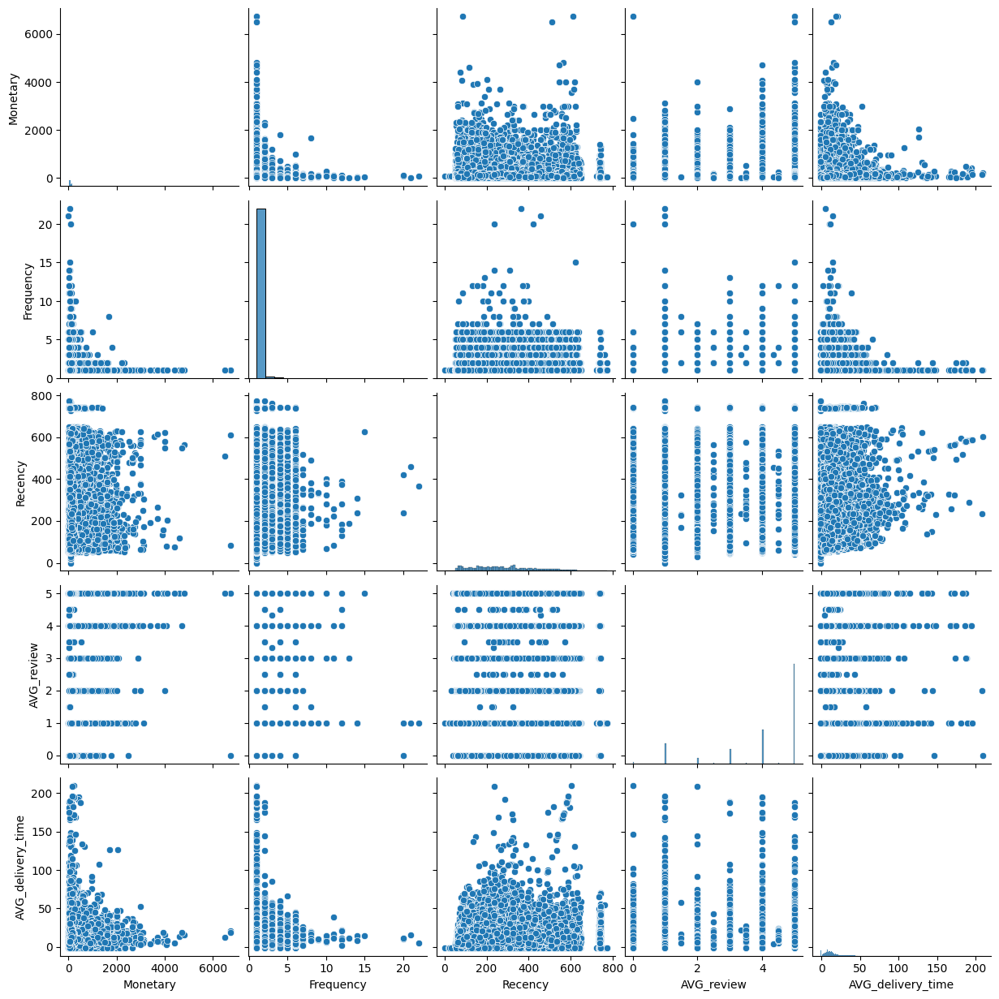

In [71]:
sns.pairplot(df_rfm_extended[['Monetary', 'Frequency', 'Recency', 'AVG_review', 'AVG_delivery_time']])
plt.show()

## Missing price and negative delivery time

### Orders missing prices

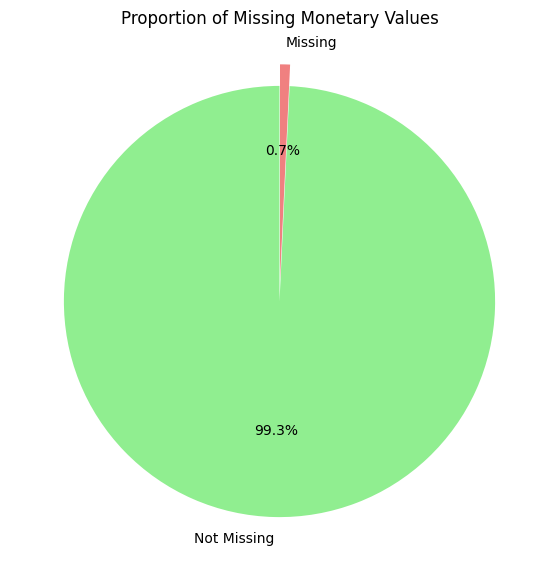

In [72]:
missing_counts = df_rfm_extended['is_monetary_missing'].value_counts()

labels = ['Not Missing', 'Missing']
colors = ['lightgreen', 'lightcoral']

plt.figure(figsize=(7, 7))
plt.pie(missing_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, explode=(0, 0.1))
plt.title('Proportion of Missing Monetary Values')
plt.show()

### Listing negative delivery time (item not delivered/order not complete)

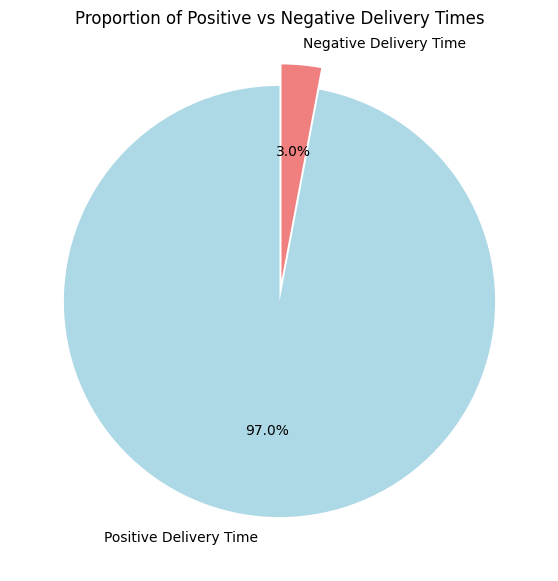

In [73]:
df_rfm_extended['is_negative_delivery_time'] = df_rfm_extended['AVG_delivery_time'] < 0

delivery_time_counts = df_rfm_extended['is_negative_delivery_time'].value_counts()

labels = ['Positive Delivery Time', 'Negative Delivery Time']
colors = ['lightblue', 'lightcoral']

plt.figure(figsize=(7, 7))
plt.pie(delivery_time_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, explode=(0, 0.1))
plt.title('Proportion of Positive vs Negative Delivery Times')
plt.show()

### Comparing missing prices with not delivered order

In [74]:
df_rfm_extended['is_negative_delivery_time'] = df_rfm_extended['AVG_delivery_time'] < 0

contingency_table = pd.crosstab(df_rfm_extended['is_negative_delivery_time'], df_rfm_extended['is_monetary_missing'])

print("Contingency Table:")
print(contingency_table)

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"\nChi-Square Statistic: {chi2}")
print(f"P-value: {p}")

if p < 0.05:
    print("There is a significant correlation between negative delivery time and missing monetary.")
else:
    print("There is no significant correlation between negative delivery time and missing monetary.")


Contingency Table:
is_monetary_missing            0    1
is_negative_delivery_time            
False                      93261    0
True                        2117  718

Chi-Square Statistic: 23763.208047630724
P-value: 0.0
There is a significant correlation between negative delivery time and missing monetary.


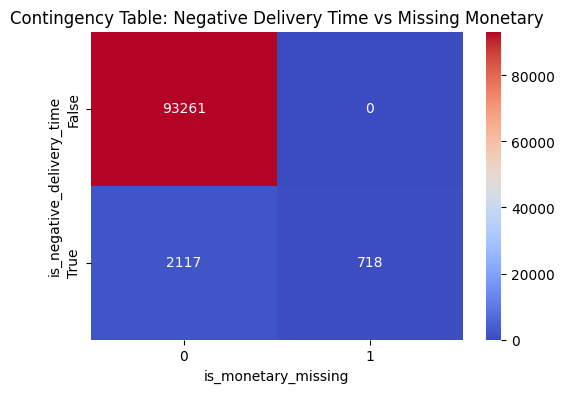

In [75]:
plt.figure(figsize=(6, 4))
sns.heatmap(contingency_table, annot=True, cmap="coolwarm", fmt="d")
plt.title("Contingency Table: Negative Delivery Time vs Missing Monetary")
plt.show()


## Full Report

In [76]:
profile = ProfileReport(df_rfm_extended, title="RFM Extended")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]